# Exploration_12

## 1. OCR

들어가기에 앞서서 오늘 사용한 이미지는 pexels.com과 upsplash.com에서 가져왔으며 일부는 직접 촬영했습니다.  
모두 저작권을 고지하지 않아도 되며 필터, 색상 등 원저작물의 분위기 일부만 수정해서 상업적으로 판매하는 경우가 아니면 상업적 비상업적 목적으로 사용이 가능합니다.

### 1.1 Module

- 사용할 패키지를 설치합니다.

In [12]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from google.colab import drive
from google.colab.patches import cv2_imshow

### 1.2 Function

- path에 있는 image와 path를 붙여서 리스트로 만들어줍니다.

In [19]:
def path(image_path_name, image_list):
  file_path = [image_path_name+'/'+name for name in image_list]
  file_path = sorted(file_path)
  return file_path

### 1.3 Image

- 사용할 이미지를 준비합니다.

In [3]:
drive.mount('/gdrive')

Mounted at /gdrive


In [20]:
E_image_path = '/gdrive/My Drive/Colab Notebooks/Text_images/E'
K_image_path = '/gdrive/My Drive/Colab Notebooks/Text_images/K'
C_image_path = '/gdrive/My Drive/Colab Notebooks/Text_images/C'

In [21]:
E_image_list = os.listdir(E_image_path)
K_image_list = os.listdir(K_image_path)
C_image_list = os.listdir(C_image_path)

In [22]:
E_image = path(E_image_path, E_image_list)
K_image = path(K_image_path, K_image_list)
C_image = path(C_image_path, C_image_list)

In [ ]:
print(E_image)

['/gdrive/My Drive/Colab Notebooks/Text_images/E/E_01.jpg', '/gdrive/My Drive/Colab Notebooks/Text_images/E/E_02.jpg', '/gdrive/My Drive/Colab Notebooks/Text_images/E/E_03.jpg', '/gdrive/My Drive/Colab Notebooks/Text_images/E/E_04.jpg']


- 다음으로 넘어갑니다.

#### 1.3.1 English Images

- 영어 이미지로 색상, 기울어짐과 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
img_1 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/E_01.jpg')
img_2 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/E_02.jpg')
img_3 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/E_03.jpg')
img_4 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/E_04.jpg')

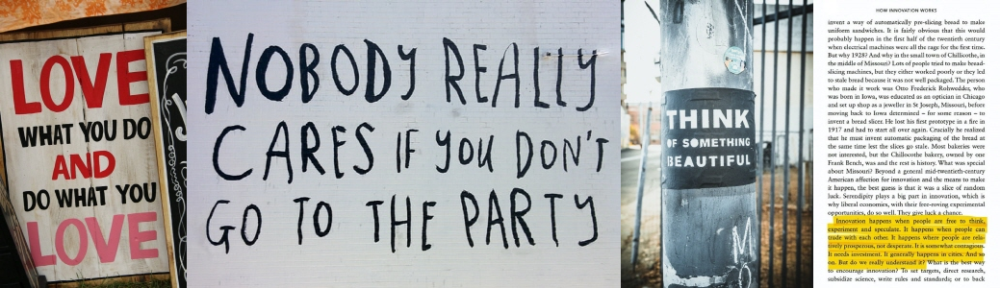

In [ ]:
hstack1 = np.hstack((img_1, img_2, img_3, img_4))
cv2_imshow(hstack1)

1) 색상과 약간의 기울어짐을 의도하였습니다.  
2) 못생긴 필기체의 인식률을 평가하고자 넣었습니다.  
3) 전봇대 특성상 좌우측이 둥근 곡선 형태로 보임을 고려했습니다.  
4) 보편적인 책의 형태로 기본적인 인식률을 평가하고자 구성에 포함했습니다.

#### 1.3.2 Car license plate Images

- 자동차 번호판 이미지로 영문, 숫자 혼용, 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
img_5 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/C_01.jpg')
img_6 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/C_02.jpg')
img_7 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/C_03.jpg')
img_8 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/C_04.jpg')

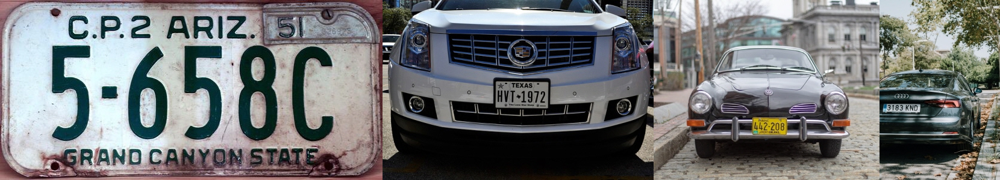

In [ ]:
hstack2 = np.hstack((img_5, img_6, img_7, img_8))
cv2_imshow(hstack2)

1) 크기가 크고 숫자 기호가 혼용된 이미지를 선택했습니다.  
2) 일반적인 번호판으로 이미지에서 번호판의 크기가 작은 부분을 고려했습니다.  
3) 2번과 비슷하지만, 번호판 배경이 노란색인 부분과 더 작은 크기를 의도했습니다.  
4) 일반적으로 자주 접하는 구도를 고려하여 넣었습니다.

#### 1.3.3 Korean Images

- 한글이 있는 이미지로 영문, 독특한 형태의 글씨체, 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
img_9 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/K_01.jpg')
img_10 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/K_02.jpg')
img_11 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/K_03.jpg')
img_12 = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/pre/K_04.jpg')

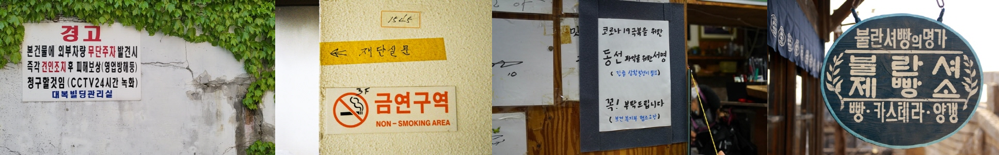

In [ ]:
hstack3 = np.hstack((img_9, img_10, img_11, img_12))
cv2_imshow(hstack3)

1) 주변에서 자주 볼 수 있는 형태의 표지판을 선택했습니다.  
2) 주 언어는 한글로 작성되었으며, 영어, 숫자, 얇은 필기체, 색상이 있는 복합적인 형태를 고려했습니다.  
3) 크기가 다른 필기체와 주변 사인의 노이즈를 의도했습니다.  
4) 마치 도형 같은 특수한 형태의 글자의 인식률을 확인하고자 넣었습니다.



---



## 2. Keras OCR

### 2.1 Module

- keras-ocr을 설치하고 import합니다.

In [ ]:
!pip install -q keras-ocr

In [13]:
import keras_ocr

- pipeline도 준비합니다.

In [ ]:
pipeline = keras_ocr.pipeline.Pipeline()

### 2.2 OCR test

#### 2.2.1 E_images

- 영어 이미지로 색상, 기울어짐과 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
images = [keras_ocr.tools.read(path) for path in E_image]
prediction_groups = [pipeline.recognize({path}) for path in E_image]

##### 1) E_01

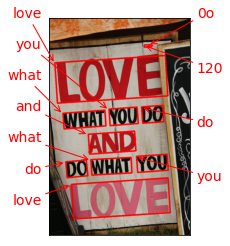

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[0], predictions=prediction_groups[0][0])

- 글씨 색상이 달라도 잘 인식합니다.
- 약간의 기울어짐이 있으나 잘 인식합니다.
- 인상적인 부분은 오른쪽 상단의 120은 사람의 눈으로도 잘 안보이는 희미한 숫자인데 인식을 했습니다.  
참고로 제 눈에는 '€20.00'으로 보여집니다.

##### 2) E_02

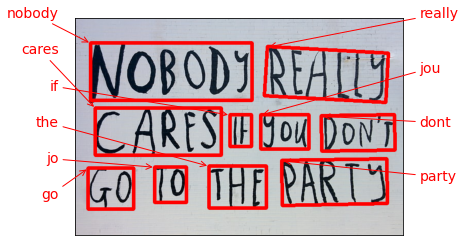

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[1], predictions=prediction_groups[1][0])

- 전형적인 못생긴 필기체입니다.
- you -> jou / to -> jo로 오인했습니다.

##### 3) E_03

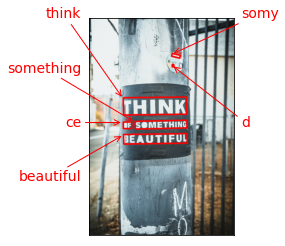

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[2], predictions=prediction_groups[2][0])

- 전봇대에 붙어서 약간의 둥근 입체감을 보여주는 이미지입니다.
- of -> ce로 잘못 인식했습니다.
- 이번에도 작은 글씨를 놓치지 않으려 노력하는 모습이 대견합니다.
- 또 하나 인상적인 부분은 'O'나 'A'에서 빈 공간이 없이 가득 찬 형태인데도 글씨로 잘 인식합니다.

##### 4) E_04

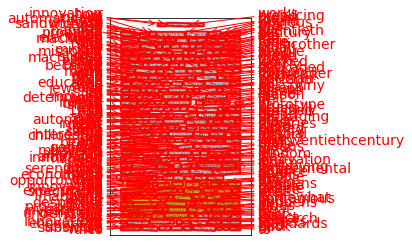

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[3], predictions=prediction_groups[3][0])

- Keras_OCR의 단점을 보여주기 위한 극단적인 이미지 선택입니다.
- 빼곡한 책 형태의 경우 결과를 시각적으로 표현하기에 무리가 있습니다.
- 잘 인식했으리라 믿어봅니다...

#### 2.2.2 C_images

- 자동차 번호판 이미지로 영문, 숫자 혼용, 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
images = [keras_ocr.tools.read(path) for path in C_image]
prediction_groups = [pipeline.recognize({path}) for path in C_image]

##### 1) C_01

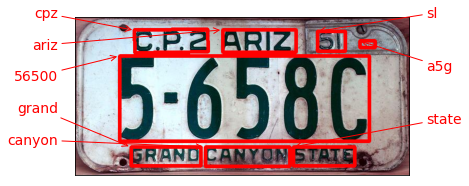

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[0], predictions=prediction_groups[0][0])

- 2 -> Z / 51 -> sl / 5-658C -> 56500 로 오인합니다.
- 상당한 노이즈를 극복하고 인식하려 노력합니다.
- 우측 상단에 a5g는 음각 글씨로 틀렸지만 사람이 눈으로 봐도 잘 모릅니다.

##### 2) C_02

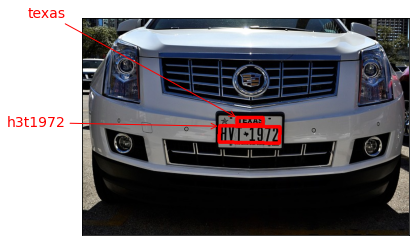

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[1], predictions=prediction_groups[1][0])

- 전체 이미지 크기에 비해 번호판이 상당히 작습니다.
- 그래서인지 번호판 최하단에 있는 매우 작은 글씨는 인식을 못 하는 모습을 보여줍니다.
- V -> 3으로 오인합니다.

##### 3) C_03

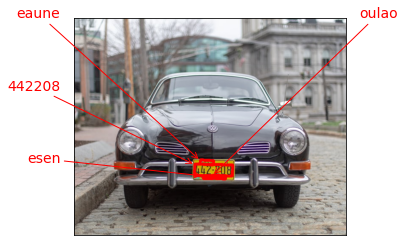

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[2], predictions=prediction_groups[2][0])

- 물론 전체 이미지에 비해 매우 작은 번호판이지만 숫자 빼고는 다 틀렸습니다.
- 숫자 사이의 점은 기호로 인식할 만한데 어렵나 봅니다.

##### 4) C_04

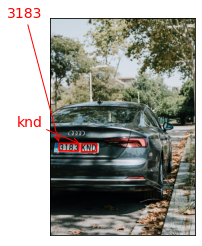

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[3], predictions=prediction_groups[3][0])

- 흰 배경에 검은 글씨라서 그런지 매우 명확하게 인식합니다.

#### 2.2.3 K_images

- 한글이 있는 이미지로 영문, 독특한 형태의 글씨체, 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
images = [keras_ocr.tools.read(path) for path in K_image]
prediction_groups = [pipeline.recognize({path}) for path in K_image]

##### 1) K_01

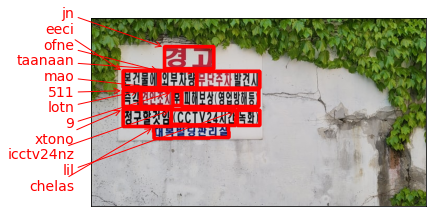

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[0], predictions=prediction_groups[0][0])

- 한글을 구분하지 못합니다.
- 그래도 이게 글씨인 줄은 아나 봅니다.

##### 2) K_02

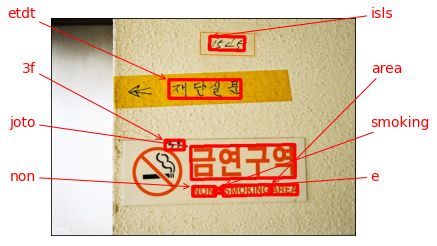

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[1], predictions=prediction_groups[1][0])

- 위와 동일합니다만, 숫자 필기체를 인식 못하는 부분이 아쉽습니다.

##### 3) K_03

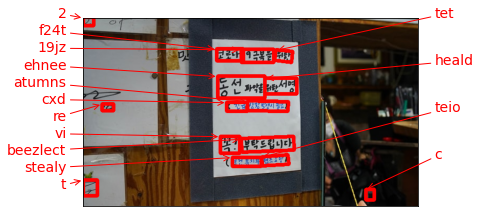

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[2], predictions=prediction_groups[2][0])

- 전혀 한글을 인식 못합니다.

##### 4) K_04

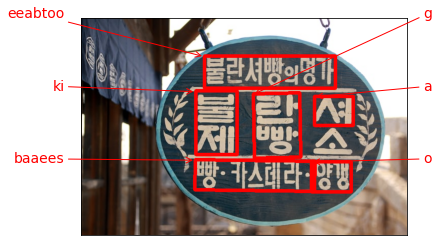

In [ ]:
keras_ocr.tools.drawAnnotations(image=images[3], predictions=prediction_groups[3][0])

- 위와 동일합니다. 넘어갑니다.



---



## 3. Tesseract

### 3.1 Module

- tesseract를 설치하고 import 합니다.

In [ ]:
!sudo apt install tesseract-ocr

In [ ]:
!sudo apt install libtesseract-dev

In [ ]:
!pip install pytesseract

In [ ]:
!sudo apt install tesseract-ocr-kor

In [14]:
import pytesseract
from pytesseract import Output
import cv2
import os
from PIL import Image
from google.colab.patches import cv2_imshow

### 3.2 Function

In [59]:
def work(name='E_01.jpg'):
  img_file_path = work_dir + '/' + name   #테스트용 이미지 경로입니다. 본인이 선택한 파일명으로 바꿔주세요. 
  img_bgr = cv2.imread(img_file_path)
  img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
  plt.imshow(img_rgb)
  plt.show()
  return img_file_path

### 3.3 OCR test

#### 3.3.1 E_images

- 영어 이미지로 색상, 기울어짐과 노이즈가 가득한 녀석들만 뽑았습니다.

In [70]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/E'
output_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/output/E'

##### 1) E_01

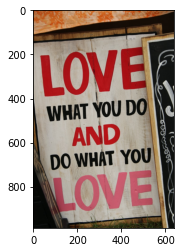

In [74]:
img_file_path = work(name='E_01.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 인식을 못 합니다...
- 평가할 수 있는 결과물을 원합니다.

##### 2) E_02

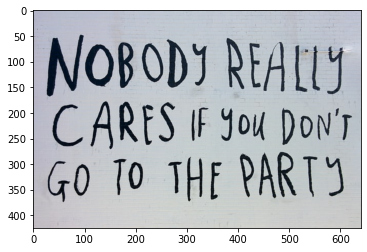

NOBODS REALLY
CARES IF You Don's
GO 10 THE PARTS



In [73]:
img_file_path = work(name='E_02.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 필기체에 대한 인식률이 별로입니다.
- NOBODY -> NODODS로 인식합니다.
- TO->10으로 인식합니다.

##### 3) E_03

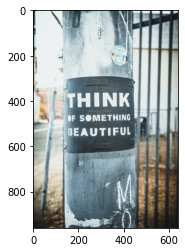

anal

oe

 



In [72]:
img_file_path = work(name='E_03.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 참혹합니다.

##### 4) E_04

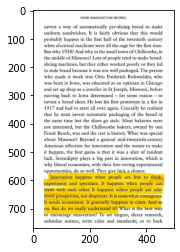

HOW INNOVATION WORKS

invent a way of automatically pre-slicing bread to make
uniform sandwiches. It is fairly obvious that this would
probably happen in the first half of the twentieth century
when electrical machines were all the rage for the first time.
But why 1928? And why in the small town of Chillicothe, in
the middle of Missouri? Lots of people tried to make bread-
slicing machines, but they either worked poorly or they led
to stale bread because it was not well packaged. The person
who made it work was Otto Frederick Rohwedder, who
was born in Iowa, was educated as an optician in Chicago
and set up shop as a jeweller in St Joseph, Missouri, before
moving back to Iowa determined — for some reason — to
invent a bread slicer. He lost his first prototype in a fire in
1917 and had to start all over again. Crucially he realized
that he must invent automatic packaging of the bread at
the same time lest the slices go stale. Most bakeries were
not interested, but the Chillocothe bakery

In [71]:
img_file_path = work(name='E_04.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 사실 이 책 페이지는 Keras OCR과 Tesseract를 노리고 가져왔습니다.
- Keras보다는 보기 좋게 나옵니다. 기계적인 글자에는 인식률이 좋은 것 같습니다.

#### 3.3.2 C_images

- 자동차 번호판 이미지로 영문, 숫자 혼용, 노이즈가 가득한 녀석들만 뽑았습니다.

In [75]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/C'
output_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/output/C'

##### 1) C_01

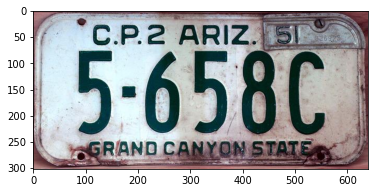

In [76]:
img_file_path = work(name='C_01.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 전혀 못 읽습니다.

##### 2) C_02

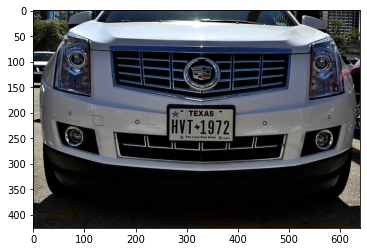

In [77]:
img_file_path = work(name='C_02.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 전혀 못 읽습니다. x 2

##### 3) C_03

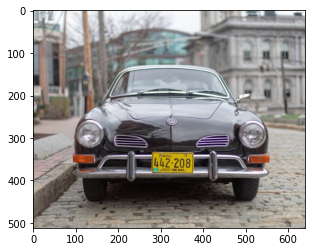

In [78]:
img_file_path = work(name='C_03.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 인식 못합니다.

##### 4) C_04

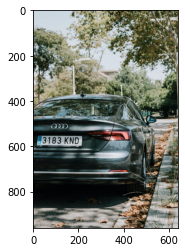

In [79]:
img_file_path = work(name='C_04.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 위와 동일합니다.
- 책 페이지처럼 가져다 떠먹여주지 않으면 인식 자체가 어렵습니다.

#### 3.3.3 K_images

- 한글이 있는 이미지로 영문, 독특한 형태의 글씨체, 노이즈가 가득한 녀석들만 뽑았습니다.

In [80]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/K'
output_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/output/K'

##### 1) K_01

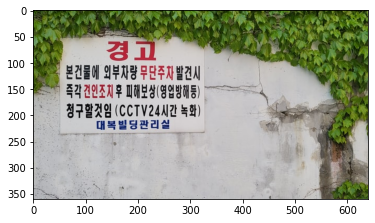

   

  
 
                                                                                                                                                                                                                                                                   

229 4부/랑무주) 불전
" 쥐젠34후패보08배티<

정구할것임(661\244|간 녹화)
대복빌딩관리실



In [82]:
img_file_path = work(name='K_01.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='kor', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 적어도 한글인 줄은 아나 봅니다.
- 대복빌딩관리실 하나는 잘 인식합니다.


##### 2) K_02

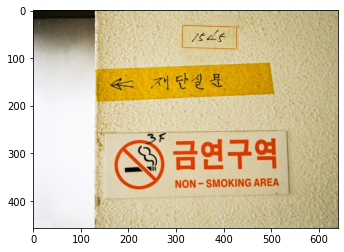

 0 38쿠9| -
;                          8081-54010846 4866

 



In [83]:
img_file_path = work(name='K_02.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='kor', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 금연구역도 인식 못 합니다...

##### 3) K_03

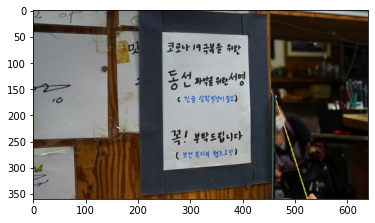

In [84]:
img_file_path = work(name='K_03.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='kor', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 인식 못합니다.

##### 4) K_04

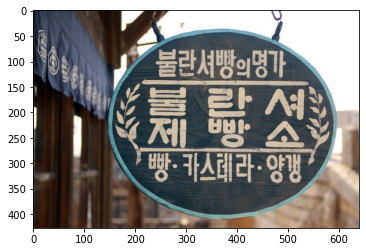

In [85]:
img_file_path = work(name='K_04.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='kor', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

- 위와 동일하게 인식 못합니다.
- 평가할 수 있는 부분이 없습니다.
- 노이즈와 불규칙적인 글자에 매우 약하다는 점은 확실합니다.



---



## 4. Easy OCR

### 4.1 Module

- Easy OCR을 설치하고 필요한 패키지를 import 합니다.

In [ ]:
!pip install easyocr

In [15]:
from matplotlib import pyplot as plt
from imutils.perspective import four_point_transform
from imutils.contours import sort_contours
import imutils
from easyocr import Reader
import cv2
import requests
import numpy as np
from PIL import ImageFont, ImageDraw, Image

In [16]:
reader = Reader(lang_list=['ko', 'en'], gpu=True)

### 4.2 OCR test

#### 4.2.1 E_images

In [ ]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/E'

##### 1) E_01

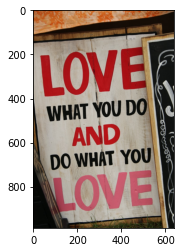

LOVEI
WHAT YOUDO
AND
DOWHAT YOUI
LOVEI


In [ ]:
img_2 = work(name='E_01.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 띄어쓰기와, 옆 테두리를 문자로 잡은 것이 신경쓰입니다.

##### 2) E_02

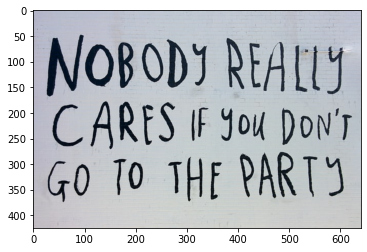

NOBoDY REAIIy
CARF) IF Yow DoN'r
60 10 개F PARTY


In [ ]:
img_2 = work(name='E_02.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 필기체에 약한 모습을 보입니다.
- NOBoDY 글자는 제대로 인식했으나 대소문자 구분이 힘든가 봅니다.

##### 3) E_03

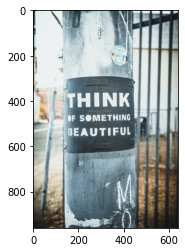

THINK
O SOMETHING
BEAUTIFUL
V


In [ ]:
img_2 = work(name='E_03.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 뜻은 통합니다만 OF의 F를 놓치는 아쉬움을 보여줍니다.
- something의 g, beautiful의 b, l을 보면 나름 좌우측 곡면을 인식했다고 볼 수 있습니다.

##### 4) E_04

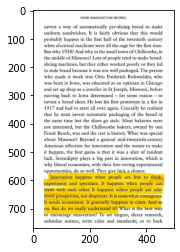

How INNOVATION WORkKS
invent
way of automatically pre-slicing bread
to make
uniform Sandwiches. It is fairly obvious that this would
probably happen
in the first half of the rwentieth century
when clectrical machines were all the rage for the first time
But why 1928? And whyin the small town of Chillicothe, in
thc middle of Missouri? Lots of pcoplc tricd to make brcad-
slicing machines
but
cither worked poorly or thcy lcd
to stalc brcad bccause it was not wcll
Packaged.The
who
made it work
was Otto Frcderick Rohwedder
who
was born in lowa, was educated as an optician in Chicago
and ser up shop as
jewcllcr in St Joscph
Missouri, bcforc
moving back to lowa determined
for some rcason
invent
brcad sliccr He lost his first prototype in
fire in
1917 and had to start all
over
Crucially he realizcd
that he
must invcnt automatic packaging Of the brcad at
the
same time lest the slices go stale
Most bakcrics
were
not
intcrcstcd, but the Chillocothe bakery owncd by
one
Frank Bench, was and the res

In [ ]:
img_2 = work(name='E_04.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 책 페이지의 긴 문장을 인식하는데도 어려움을 보입니다.

#### 4.2.2 C_images

In [ ]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/C'

##### 1) C_01

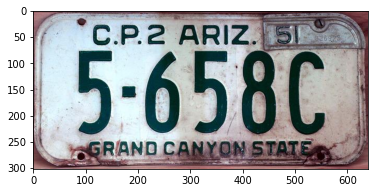

CP2 PRIZ
51
5-658C
GRIAND CANYON STATF


In [ ]:
img_2 = work(name='C_01.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 드디어 C.P.2의 숫자 2를 정확히 인식하는 모델을 만났습니다.
- 번호판 곳곳의 노이즈에 반응하여 불필요한 문자를 추가했습니다.

##### 2) C_02

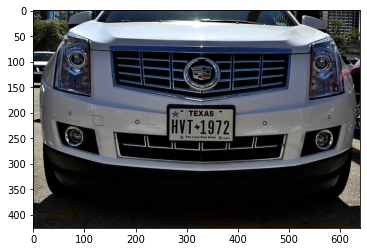

TEXAS
HVI+1g72


In [ ]:
img_2 = work(name='C_02.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 글자 크기가 작아도 인식하는 모습을 보입니다만, 기호에 약하고 숫자와 알파벳이 비슷하면 잘 구분을 못합니다.

##### 3) C_03

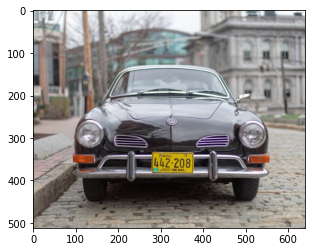

Ein오r
1442.208


In [ ]:
img_2 = work(name='C_03.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 번호판의 테두리를 글자로 인식했다는 점을 보면 번호판 상단부분과 차량의 색상이 유사하면 테두리로 인식하지 못하는 것 같습니다.

##### 4) C_04

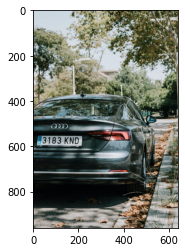

3183 KND


In [ ]:
img_2 = work(name='C_04.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 일반적으로 사람의 시선에서 주로 볼 수 있는 번호판 구도에서는 큰 무리없이 인식합니다.

#### 4.2.3 K_images

In [ ]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/K'

##### 1) K_01

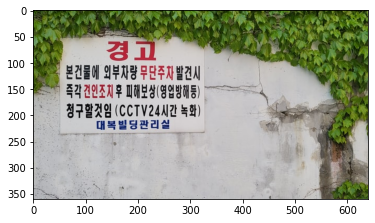

경고
본건물쎄 외부자량 무단주지 발견시
즉각권인조후 때해보성(영업방해등
청구활것임 (CCTV24N간 녹화)
대목 빌딩관리실


In [ ]:
img_2 = work(name='K_01.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 전체적으로 인식률은 좋지 못한 모습을 보입니다만, 한글을 지원합니다.

##### 2) K_02

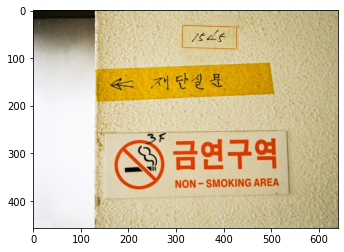

1545
재 단실 문
금연구역
NON -
SMOKING AREA


In [ ]:
img_2 = work(name='K_02.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 숫자와 영어, 한글의 혼용이 있어도 각 문자를 인식하려 노력합니다.

##### 3) K_03

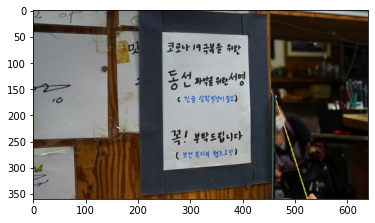

코로나 19 극복올 위출
동선 과색 유탕서명
긴급 상방 발생시 필로)
꼭! 부탁드컵니다
보전 복지부 협조요방)


In [ ]:
img_2 = work(name='K_03.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 역시 필기체에 약합니다.

##### 4) K_04

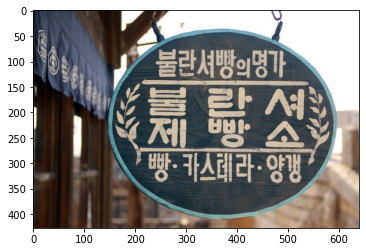

불관서빵의평가
초
탑 서
빵 소
빵 카스라 양생


In [ ]:
img_2 = work(name='K_04.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

- 지금까지 Easy OCR의 결과를 보면 기계로 작성한 듯한 명확한 글자체와 노이즈가 적은 형태면  
어느정도의 높은 인식률을 보여줄 수 있겠다는 생각이 듭니다.

In [ ]:
langs = ['ko', 'en']
 
print("[INFO] OCR'ing input image...")
reader = Reader(lang_list=langs, gpu=True)
results = reader.readtext(business_card_image)



---



## 5. Pororo

### 5.1 Module

- 우리 Pororo를 설치하고 import합니다.

In [ ]:
!pip install --upgrade pip

In [ ]:
!git clone https://github.com/kakaobrain/pororo.git

In [5]:
ls

pororo/  sample_data/


In [6]:
cd pororo

/content/pororo


In [ ]:
!pip install -e .

In [8]:
!pwd

/content/pororo


In [17]:
from pororo import Pororo
import pandas as pd
import numpy as np

from google.colab import drive
from google.colab.patches import cv2_imshow

### 5.2 Function

- 어떤 task를 수행할 수 있나 한번 살펴봅니다.

In [ ]:
dir(Pororo)

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 'available_models',
 'available_tasks']

In [ ]:
Pororo.available_tasks()

"Available tasks are ['mrc', 'rc', 'qa', 'question_answering', 'machine_reading_comprehension', 'reading_comprehension', 'sentiment', 'sentiment_analysis', 'nli', 'natural_language_inference', 'inference', 'fill', 'fill_in_blank', 'fib', 'para', 'pi', 'cse', 'contextual_subword_embedding', 'similarity', 'sts', 'semantic_textual_similarity', 'sentence_similarity', 'sentvec', 'sentence_embedding', 'sentence_vector', 'se', 'inflection', 'morphological_inflection', 'g2p', 'grapheme_to_phoneme', 'grapheme_to_phoneme_conversion', 'w2v', 'wordvec', 'word2vec', 'word_vector', 'word_embedding', 'tokenize', 'tokenise', 'tokenization', 'tokenisation', 'tok', 'segmentation', 'seg', 'mt', 'machine_translation', 'translation', 'pos', 'tag', 'pos_tagging', 'tagging', 'const', 'constituency', 'constituency_parsing', 'cp', 'pg', 'collocation', 'collocate', 'col', 'word_translation', 'wt', 'summarization', 'summarisation', 'text_summarization', 'text_summarisation', 'summary', 'gec', 'review', 'review_s

- 수많은 tasks에 혼란에 빠질 것 같습니다. 재빠르게 OCR을 선택합니다.

In [18]:
ocr = Pororo(task='ocr')

### 5.3 OCR test

#### 5.3.1 E_images

- 영어 이미지로 색상, 기울어짐과 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/E'

##### 1) E_01

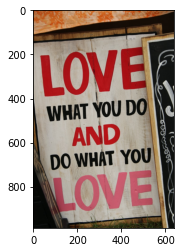

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['LOVES WHAT YOUDO AND DO WHAT YOU LOVE']

In [ ]:
work(name='E_01.jpg')
ocr(work_dir + '/E_01.jpg')

- 생각보다 오인한 부분이 많습니다만, 대문자를 대문자로 인식한 부분이 인상적입니다.

##### 2) E_02

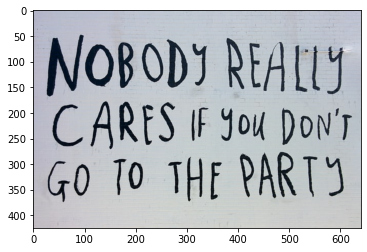

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


["NOBODJ REA[ly CARFS 'F yOu DoN'T GO T0 THE PART)"]

In [ ]:
work(name='E_02.jpg')
ocr(work_dir + '/E_02.jpg')

- 필기체에 상당히 약한 모습을 보입니다.

##### 3) E_03

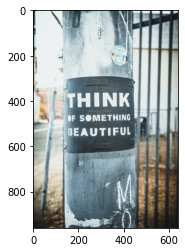

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['THINK IF SOMETHING GEAUTIFUL', 'M']

In [ ]:
work(name='E_03.jpg')
ocr(work_dir + '/E_03.jpg')

- 둥근 형태의 입체감이 있습니다. 
- 좌우측으로 글자의 왜곡 때문인지 오인합니다.

##### 4) E_04

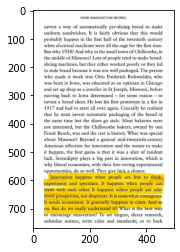

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['HOW INNOVATION WORKS',
 "invent way of automatically poe-slicing bread to make uniform sandwiches. It is fairty obviows chat this would! probably happen in the first half of the twentieth century wwhn edestrical machines were all the rage for the first time. But why 1928? And why in the small nowrn of Chillicntbe, in the middle of Missour? Lots of peoplk tried to make bread- slicing machines, but they cither worked poorly or they led to smalk thread hecause it was not well packaged. The person who made it work was Oto Frederick Rohweddet, who was bom in lowa, was cducated as an optician in Chicogp and set up shop as jeweller in StJoscph, Missouri, beforc moving back to lowa determined for some reason invent bread slicen He lost his finst prototype in fire in 1917 and had to star all over again. Crucially he realized that he mus invent automatic packaging of the bread ar the same time lest the slices go stale. Most bakeries were cor innrested, but the Chilocothe bakery, owned by one F

In [ ]:
work(name='E_04.jpg')
ocr(work_dir + '/E_04.jpg')

- 상당히 정확하게 집어냅니다. 
- 노이즈가 비교적 적은 정직한 문자는 잘 인식하는 모습을 보여줍니다.

#### 5.3.2 C_images

- 자동차 번호판 이미지로 영문, 숫자 혼용, 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/C'

##### 1) C_01

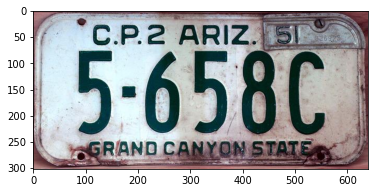

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


["C.P.Z ARIZ ' 5-658C GRANO CANYON STATE"]

In [ ]:
work(name='C_01.jpg')
ocr(work_dir + '/C_01.jpg')

- Keras OCR과 동일하게 숫자 2를 Z로 오인합니다.
- 기호도 인식해줍니다.

##### 2) C_02

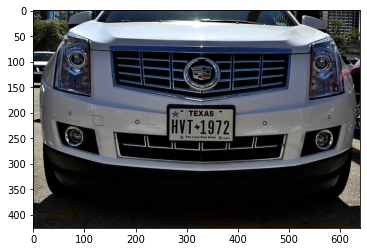

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['TEXAS', 'HYT-1972']

In [ ]:
work(name='C_02.jpg')
ocr(work_dir + '/C_02.jpg')

- 전체 이미지에 비해 작은 번호판의 글씨도 인식하려 합니다.
- V -> Y로 인식합니다.

##### 3) C_03

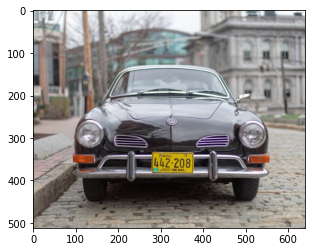

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['HAINE', '442:208']

In [ ]:
work(name='C_03.jpg')
ocr(work_dir + '/C_03.jpg')

- 위 이미지에서 숫자를 제외한 문자는 사람도 알아보기 힘듭니다.

##### 4) C_04

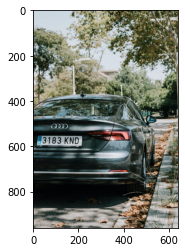

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['3183 KND']

In [ ]:
work(name='C_04.jpg')
ocr(work_dir + '/C_04.jpg')

- Keras OCR과 마찬가지로 잘 인식합니다.

#### 5.3.3 K_images

- 한글이 있는 이미지로 영문, 독특한 형태의 글씨체, 노이즈가 가득한 녀석들만 뽑았습니다.

In [ ]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/K'

##### 1) K_01

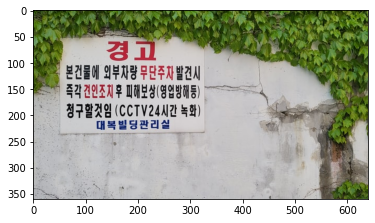

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['경고', '본건물에 외부자량 무단주자 발견시 즉각 견인조지 후 피해보상( 영업방해등) 정구 할것임(CCTV24시간 녹화) 대복빌딩관리실']

In [ ]:
work(name='K_01.jpg')
ocr(work_dir + '/K_01.jpg')

- 한글을 명확하게 인식합니다.
- 누구처럼 lang='kor'을 써줄 필요도 없습니다.

##### 2) K_02

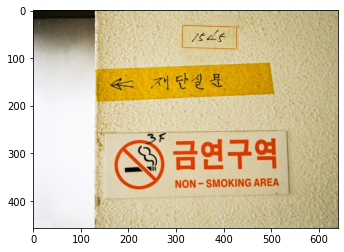

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['1545', '재 단실 문', '금연구역 NON - SMOKING AREA']

In [ ]:
work(name='K_02.jpg')
ocr(work_dir + '/K_02.jpg')

- 숫자, 영문, 한글 다 잘 구분하여 표기합니다.

##### 3) K_03

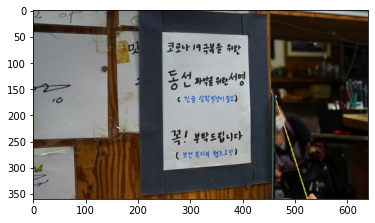

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


['코로나 19극복을 위탄', '동선 저1웨서명 긴급 상황발생시 필요)', '쪽! 부탁드립니다 보건 복지부 협조요앙)']

In [ ]:
work(name='K_03.jpg')
ocr(work_dir + '/K_03.jpg')

- 한글 필기체는 영어 필기체보다 인식을 잘하는 것 같습니다.
- 틀린 부분도 있지만 이 정도면 양호하다고 판단됩니다.
- 위에서 답답했던 고구마 100개가 내려가는 느낌입니다.

##### 4) K_04

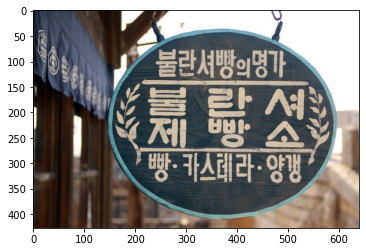

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


["불란셔빵의명가 제 란서 빵소' 빵: 카스데라 양갱"]

In [ ]:
work(name='K_04.jpg')
ocr(work_dir + '/K_04.jpg')

- 한글을 생각보다 잘 인식하는 부분이 인상적입니다.
- 전체적으로 다른 두 모델에 비해 오인이 적은 편입니다.



---



### 5.4 Challenge

- 제일 인식률이 높아 보이는 뽀로로를 대상으로 한 가지 더 실험해봅니다.
- 회전된 글자도 잘 인식할지 알아봅니다.

#### 5.4.1 Rotated Text

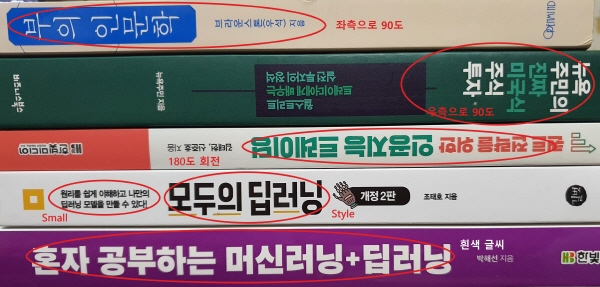

In [ ]:
books = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/etc2/marked_01.jpg')
cv2_imshow(books)

- 맨 위부터 좌측으로 90도 회전한 글자, 우측으로 90도 회전한 글자, 180도 회전한 글자,  
작은 글자, 스타일이 입혀진 글자, 흰색으로 강조된 글자가 있습니다.

In [ ]:
ocr('/gdrive/My Drive/Colab Notebooks/Text_images/etc/book_01.jpg')

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3384: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  warnings.warn("Default grid_sample and affine_grid behavior has changed "


["파이하마자 피;애<山(아T) Cbtmino 뉴&|터보남러> 최초물열철5 극하(아기이R트 식 믹의 피리금지용 oDDAic대 공)1 주준구 금지 ')이보금 옥(K'은i급 ias @늘급 금품",
 '원리] 쉽게 야해하고 나만의 덥러닝 모면을 만할 수 있다!. 모두의 딥러닝',
 '개정2판',
 '조태한 지음',
 '혼자 공부하는 머신러닝+텔러닝 박혜선 지금',
 '19년']

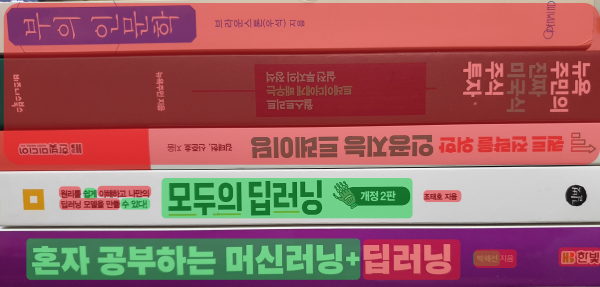

In [ ]:
result = cv2.imread('/gdrive/My Drive/Colab Notebooks/Text_images/etc2/result_01.png')
cv2_imshow(result)

- 비교해본 OCR 중에서 가장 인식률이 높다고 생각하는 Pororo OCR이지만,  
글자가 회전된 상태면 인식이 불가능하다는 점을 확인할 수 있습니다.

## 6. Improve

- 의도적으로 노이즈가 심한 이미지를 구했지만, 너무 과했다 싶습니다. 반성합니다.
- 어쨌거나 이 노이즈를 줄여주면, 인식률이 더 높아지리라 생각하기 때문에 방법을 고민해 봅니다.
- 첫째, 노이즈가 매우 적은 깔끔한 이미지만 넣어준다.
- 둘째, grayscale로 색상으로 인한 노이즈를 줄여준다.
- 셋째, Median blur로 잡티 같은 노이즈를 뭉개준다.

### 6.1 Original image

##### 1) Original

- license plate 원본 이미지를 불러옵니다

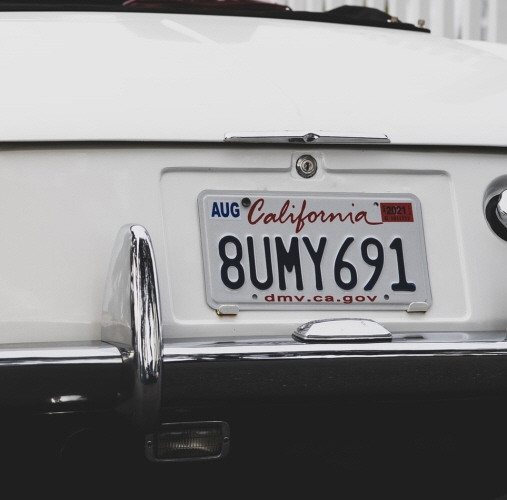

In [10]:
img_1 = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/C_05.jpg'
img_1 = cv2.imread(img_1)
cv2_imshow(img_1)

##### 2) Keras OCR

In [27]:
Extra_path = '/gdrive/My Drive/Colab Notebooks/Text_images/extra'
Extra_list = os.listdir(Extra_path)
Extra_image = path(Extra_path, Extra_list)

In [31]:
images = [keras_ocr.tools.read(path) for path in Extra_image]
prediction_groups = [pipeline.recognize({path}) for path in Extra_image]

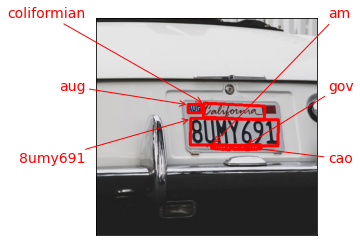

In [32]:
keras_ocr.tools.drawAnnotations(image=images[0], predictions=prediction_groups[0][0])

##### 3) Tesseract

In [87]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/extra'
output_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/output/extra'
custom_oem_psm_config = r'--oem3 --psm 3'

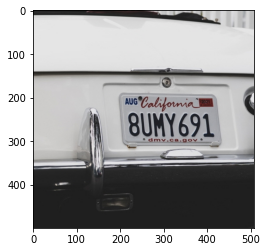

eT

SN
— TEE aoa

\\ UHV

 



In [88]:
img_file_path = work(name='C_05.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

##### 4) Easy OCR

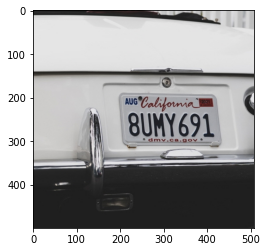

AUG
Oalilorwia
8UMY691
OT V
ca_gov


In [89]:
img_2 = work(name='C_05.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

##### 5) Pororo

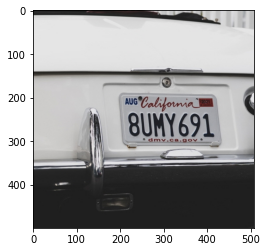

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4194: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


["AUG 'Calidormia) BUMY691 dmv ca.gov"]

In [90]:
work(name='C_05.jpg')
ocr(work_dir + '/C_05.jpg')

### 6.2 Preprocess

- 원본 이미지에 여러가지 전처리를 통해 인식률을 비교합니다.  

#### 6.2.1 Grayscale

- 원본 사진에 grayscale을 적용하여 비교합니다.

##### 1) Grayscale

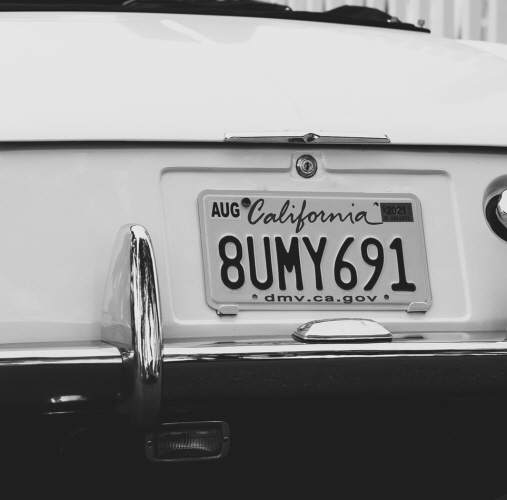

In [40]:
gray = cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY)
cv2.imwrite('/gdrive/My Drive/Colab Notebooks/Text_images/extra/gray/C_05.jpg', gray)
cv2_imshow(gray)

##### 2) Keras OCR

In [42]:
Extra_path = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/gray'
Extra_list = os.listdir(Extra_path)
Extra_image = path(Extra_path, Extra_list)

In [43]:
images = [keras_ocr.tools.read(path) for path in Extra_image]
prediction_groups = [pipeline.recognize({path}) for path in Extra_image]

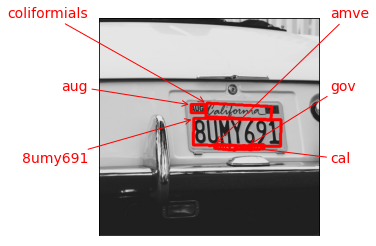

In [44]:
keras_ocr.tools.drawAnnotations(image=images[0], predictions=prediction_groups[0][0])

##### 3) Tesseract

In [66]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/gray'
output_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/output/extra/gray'
custom_oem_psm_config = r'--oem3 --psm 3'

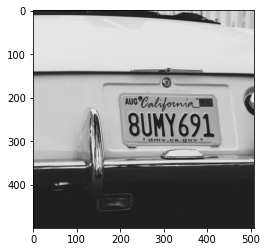

eT
i ————

apm (
) SUNY6OL

— —

 
 



In [67]:
img_file_path = work(name='C_05.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

##### 4) Easy OCR

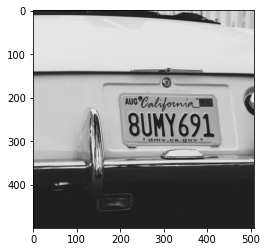

AUG
'Calsownia
8UMY691
OT V
ca_gov


In [48]:
img_2 = work(name='C_05.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

##### 5) Pororo

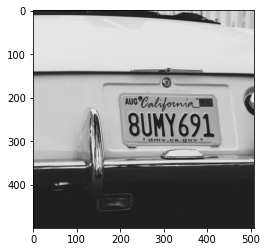

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4194: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


['AUG\' "Califomia)) BUMY691 dmv ca.gov']

In [49]:
work(name='C_05.jpg')
ocr(work_dir + '/C_05.jpg')

#### 6.2.2 Threshold

- grayscale로 변환한 이미지를 흑백(0, 255)으로 나눠줍니다.

##### 1) Threshold

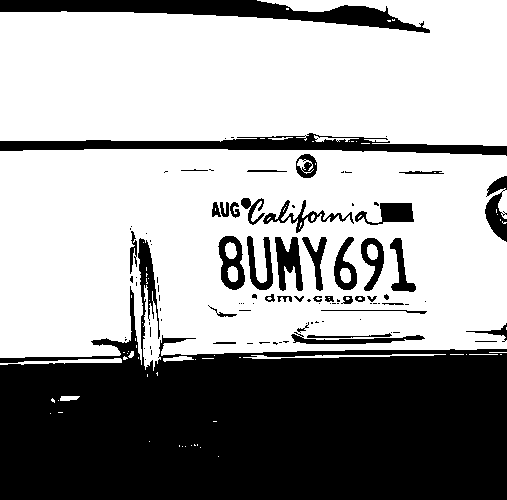

In [41]:
bnw = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
cv2.imwrite('/gdrive/My Drive/Colab Notebooks/Text_images/extra/threshold/C_05.jpg', bnw)
cv2_imshow(bnw)

##### 2) Keras OCR

In [91]:
Extra_path = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/threshold'
Extra_list = os.listdir(Extra_path)
Extra_image = path(Extra_path, Extra_list)

In [51]:
images = [keras_ocr.tools.read(path) for path in Extra_image]
prediction_groups = [pipeline.recognize({path}) for path in Extra_image]

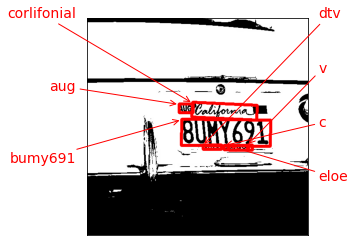

In [52]:
keras_ocr.tools.drawAnnotations(image=images[0], predictions=prediction_groups[0][0])

##### 3) Tesseract

In [92]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/threshold'
output_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/output/extra/threshold'
custom_oem_psm_config = r'--oem3 --psm 3'

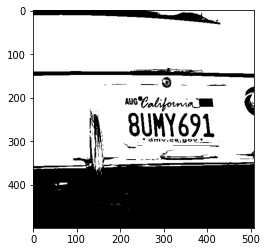

eee

ey
oe Petje a

i UNL

<

 



In [93]:
img_file_path = work(name='C_05.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

##### 4) Easy OCR

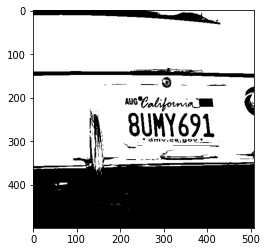

A6'Oaliorwiar
8UNY691
아5T
표:-오9


In [95]:
img_2 = work(name='C_05.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

##### 5) Pororo

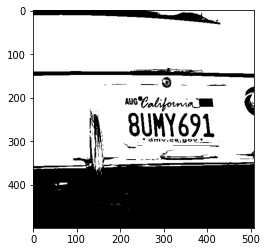

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4194: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


['ws"Codifowia]@ BUNY691 JTY 4.go']

In [96]:
work(name='C_05.jpg')
ocr(work_dir + '/C_05.jpg')

#### 6.2.3 Median Blur

- median blur를 통해 픽셀들이 뭉치는 효과를 통해 번호판 가운데 검은 글자를 돋보이게 하겠습니다.

##### 1) Blur

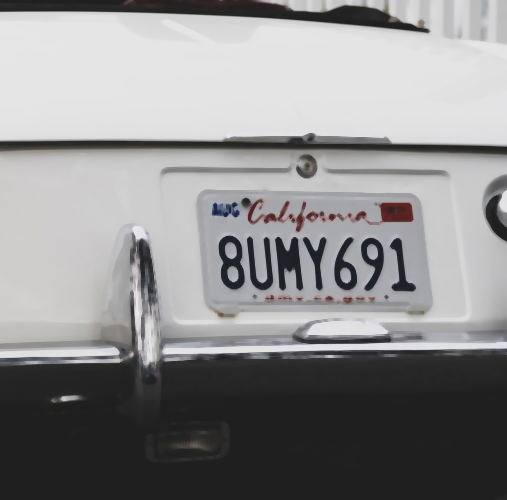

In [105]:
result = cv2.medianBlur(img_1, ksize=5)
cv2.imwrite('/gdrive/My Drive/Colab Notebooks/Text_images/extra/blur/C_05.jpg', result)
cv2_imshow(result)

##### 2) Keras OCR

In [106]:
Extra_path = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/blur'
Extra_list = os.listdir(Extra_path)
Extra_image = path(Extra_path, Extra_list)

In [107]:
images = [keras_ocr.tools.read(path) for path in Extra_image]
prediction_groups = [pipeline.recognize({path}) for path in Extra_image]

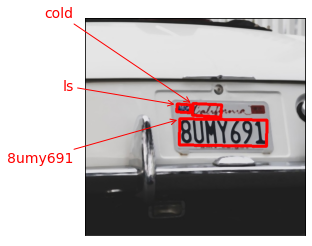

In [108]:
keras_ocr.tools.drawAnnotations(image=images[0], predictions=prediction_groups[0][0])

##### 3) Tesseract

In [109]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/blur'
output_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/output/extra/blur'
custom_oem_psm_config = r'--oem3 --psm 3'

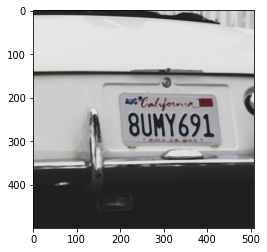

Se

1 BUNY69

(  —————

4

 



In [110]:
img_file_path = work(name='C_05.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

##### 4) Easy OCR

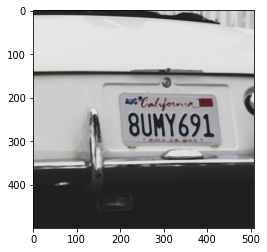

내s
'Csloso
8UHY691


In [112]:
img_2 = work(name='C_05.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

##### 5) Pororo

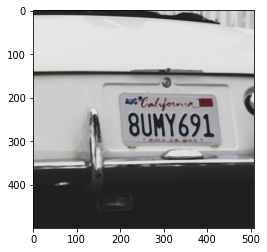

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4194: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


["~ 'aljosm BUNY691"]

In [111]:
work(name='C_05.jpg')
ocr(work_dir + '/C_05.jpg')

#### 6.2.4 Bilateral Filter

- Bilateral filter는 경계선부분은 살려주면서 blurring을 하는 것처럼 이미지를 변환한다고 합니다.

##### 1) Filter

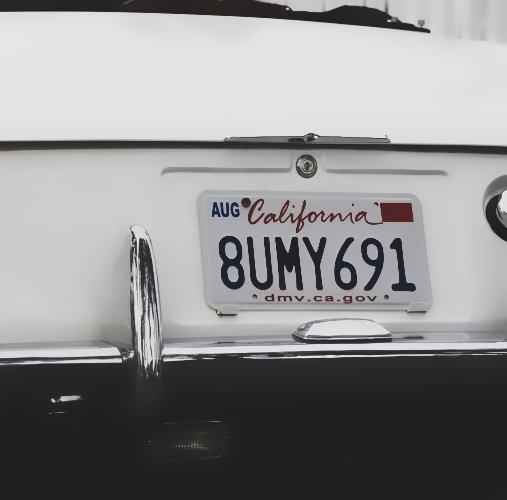

In [138]:
result_2 = cv2.bilateralFilter(img_1, -1, 70, 10)
cv2.imwrite('/gdrive/My Drive/Colab Notebooks/Text_images/extra/filter/C_05.jpg', result_2)
cv2_imshow(result_2)

##### 2) Keras OCR

In [139]:
Extra_path = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/filter'
Extra_list = os.listdir(Extra_path)
Extra_image = path(Extra_path, Extra_list)

In [140]:
images = [keras_ocr.tools.read(path) for path in Extra_image]
prediction_groups = [pipeline.recognize({path}) for path in Extra_image]

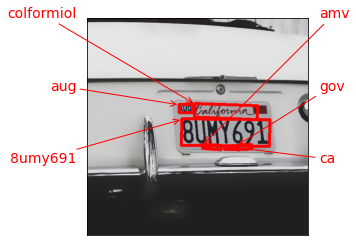

In [141]:
keras_ocr.tools.drawAnnotations(image=images[0], predictions=prediction_groups[0][0])

##### 3) Tesseract

In [142]:
work_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/extra/filter'
output_dir = '/gdrive/My Drive/Colab Notebooks/Text_images/output/extra/filter'
custom_oem_psm_config = r'--oem3 --psm 3'

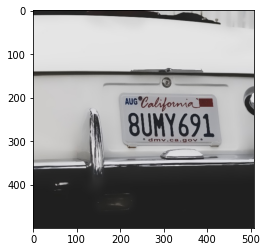

a
 SUMY69L

= ——

 

 



In [143]:
img_file_path = work(name='C_05.jpg')
recognized_data = pytesseract.image_to_string(img_file_path, lang='eng', config=custom_oem_psm_config, output_type=Output.DICT)
print(recognized_data['text'])

##### 4) Easy OCR

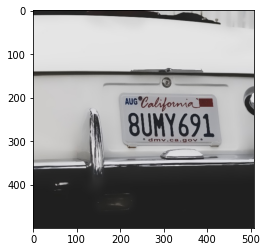

AUG
'Oalilorwian
8UNY691
GT V
ca-gov


In [144]:
img_2 = work(name='C_05.jpg')
results = reader.readtext(img_2, detail = 0)
for x in results[:]:
  print(x)

##### 5) Pororo

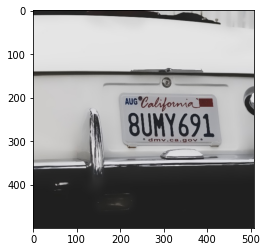

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4194: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of grid_sample for details.
  "Default grid_sample and affine_grid behavior has changed "


["AUG' 'Caliormvia] BUMY691 dmv ca.gov"]

In [145]:
work(name='C_05.jpg')
ocr(work_dir + '/C_05.jpg')

### 6.3 Conclusion

- 처음부터 좋은 이미지를 구합시다.  
무슨 짓을 해도 눈에 띄는 인식률 상승을 기대하기 어렵습니다.
- 그나마 bilateral filter는 의미 있는 결과가 있습니다.  
원본에서 ca.을 filter 처리하면 ca로 인식하고 필터 처리를 안하면 cao로 인식합니다.  
- 그래도 원본을 좋은 이미지로 가져옵시다...

- 만일 차량 번호판을 인식하는 OCR를 고려한다면, 최우선으로 Pororo를 염두에 둘 것이고 가장 큰 이유는 인식한 문자의 정확도입니다.  
Tesseract <<<<< Easy OCR <= Keras OCR < Pororo 

##### 1) Keras OCR : ★★☆
- 나름 준수한 인식률을 가지고 있으나 긴 글을 시각화 하기에 부적절, 한글 인식을 못함

##### 2) Teseract : ★
- 심각할 정도로 낮은 인식률, 이미지를 가려받는 깐깐함

##### 3) Easy OCR : ★★☆
- 나쁘지 않은 인식률, 영문 대소문자, 한글 구분 가능

##### 4) Pororo : ★★★☆
- 4가지 모델 중 가장 높은 인식률, 영문 대소문자, 한글 구분, 필기체에도 사용 가능하고 기호를 인식함  
한글 필기체의 인식은 준수한 편이라고 판단되나, 영어 필기체에 대한 인식률을 높일 필요가 있어 보임  
넷 중 하나를 고르라고 한다면 주저 없이 Pororo를 선택할 것 같음

## 7. Retrospect

##### 1) Pytesseract
- 인식률이 별로라서 놀랐고, 이 수준이라면 다른 모델을 사용하는 것이 좋겠다는 더 효율적이라는 생각입니다.  
- LSTM으로 학습해서 사용할 수 있다고 하는데 찾아보면 이미 학습된 모델이 있을 것 같습니다.  
다음에는 학습된 모델을 찾아 사용해보고 싶습니다.

##### 2) Image preprocess
- 이미지 자체에 노이즈가 강한 것은 맞지만 대부분 평소 일상에서 볼 수 있는 이미지로 저것보다 잘 찍은 이미지를 찾기도 쉽지 않을 겁니다.
- 분명 전처리가 효과 있을 것이라 생각했는데 결과가 아쉽습니다.  
다음에는 정말 깔끔하고 멀쩡한 사진으로 다시 해보려합니다만, 이미 원본 단계에서 잘 예측할겁니다...

##### 3) Bilateral Filter
- 양방향 필터의 인자를 주면서 변화를 살펴봤습니다.  
색의 경계 부분을 남기면서 나머지를 뭉개는 형태를 보이는데 꼭 포토샵 처리를 해주는 것 같습니다.  
이번에는 별다른 색채가 없는 차량 사진이여서 눈에 띄는 변화는 안보이지만, 인물 사진을 넣으면 변화를 쉽게 관찰할 수 있을 것 같습니다.

##### 4) Google API
- Google API가 좋다던데 이미 무료 크레딧도 다 소모한 상태이고, 시간상 써보지 못하고 넘어가는 것이 아쉽습니다.  
KAKAO API, Clova API등 대기업에서 서비스하는 OCR도 사용해보고 싶습니다.

##### 5) Service
- 유독 차량 번호판 사진을 많이 사용한 이유는 OCR을 통해 차량 번호판을 인식하고 차량의 위치를 실시간으로 추적하는 시스템을 구축하면 좋을 것 같다는 생각에서 시작했습니다.  
- 특히 용의 차량이나 범죄에 연류된 차량을 사람이 직접 찾아내기 전에 영상을 돌리며 OCR로 판독하고 다른 영상에서도 자동으로 해당 번호를 찾아 이동 경로를 파악하게 하면 수사가 쉽게 진행될 수 있을 것 같습니다.
- 이런 부분을 잘 활용하면 제보 사진을 전송해주면 제보 사진의 기본 정보(시간, 위치 등)과 OCR 번호판 데이터를 적절히 조합하여 좀 더 세밀한 위치까지도 파악할 수 있을 것이라 생각합니다.

## 8. References

- 아래의 사이트에서 큰 도움을 받았습니다.

##### 1) Image data
- https://unsplash.com/
- https://www.pexels.com/ko-kr/

##### 2) Keras OCR
- https://colab.research.google.com/github/bhattbhavesh91/keras-ocr-demo/blob/main/keras-ocr-notebook.ipynb

##### 3) Tesseract
- https://nanonets.com/blog/ocr-with-tesseract/
- https://github.com/tesseract-ocr/tesseract/blob/main/doc/tesseract.1.asc#config-files-and-augmenting-with-user-data

##### 4) Easy OCR
- https://www.jaided.ai/easyocr/
- https://github.com/JaidedAI/EasyOCR
- https://yunwoong.tistory.com/76

##### 5) image process
- https://tesseract-ocr.github.io/tessdoc/ImproveQuality
- https://deep-learning-study.tistory.com/163
- https://wjh2307.tistory.com/11

##### 6) info
- https://keep-steady.tistory.com/36
- https://webnautes.tistory.com/1270?category=756330
- https://velog.io/@cha-suyeon/%EB%94%A5%EB%9F%AC%EB%8B%9D-OCR1-Text-detection